# Gravity data processing

In [1]:
import pathlib
import numpy as np
import pandas as pd
import xarray as xr
import pyproj
import pygmt
import ensaio
import verde as vd
import boule as bl
import harmonica as hm
import pyvista as pv

In [2]:
figsdir = pathlib.Path("..") / "figs"

In [3]:
# Define region to crop Bushveld Igenous Complex
region = (25, 32, -27, -23)

In [4]:
import matplotlib

class FixPointNormalize(matplotlib.colors.Normalize):
    """ 
    Inspired by https://stackoverflow.com/questions/20144529/shifted-colorbar-matplotlib
    Subclassing Normalize to obtain a colormap with a fixpoint 
    somewhere in the middle of the colormap.
    This may be useful for a `terrain` map, to set the "sea level" 
    to a color in the blue/turquise range. 
    """
    def __init__(self, vmin=None, vmax=None, sealevel=0, col_val = 0.21875, clip=False):
        # sealevel is the fix point of the colormap (in data units)
        self.sealevel = sealevel
        # col_val is the color value in the range [0,1] that should represent the sealevel.
        self.col_val = col_val
        matplotlib.colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        x, y = [self.vmin, self.sealevel, self.vmax], [0, self.col_val, 1]
        return np.ma.masked_array(np.interp(value, x, y))

## Download datasets

In [5]:
path_gravity = ensaio.fetch_southern_africa_gravity(version=1)
path_topography = ensaio.fetch_earth_topography(version=1)
path_geoid = ensaio.fetch_earth_geoid(version=1)

Load data

In [6]:
raw_data = pd.read_csv(path_gravity)
topography = xr.load_dataarray(path_topography)
geoid = xr.load_dataarray(path_geoid)

### Plot raw data

Configure PyGMT plots

In [7]:
pygmt.config(
    FONT_ANNOT="11p,Helvetica,black",
    FONT_TITLE="12p,Helvetica,black",
    FONT_LABEL="10p,Helvetica,black",
    MAP_TITLE_OFFSET="0p",
    MAP_FRAME_WIDTH="2p",
)

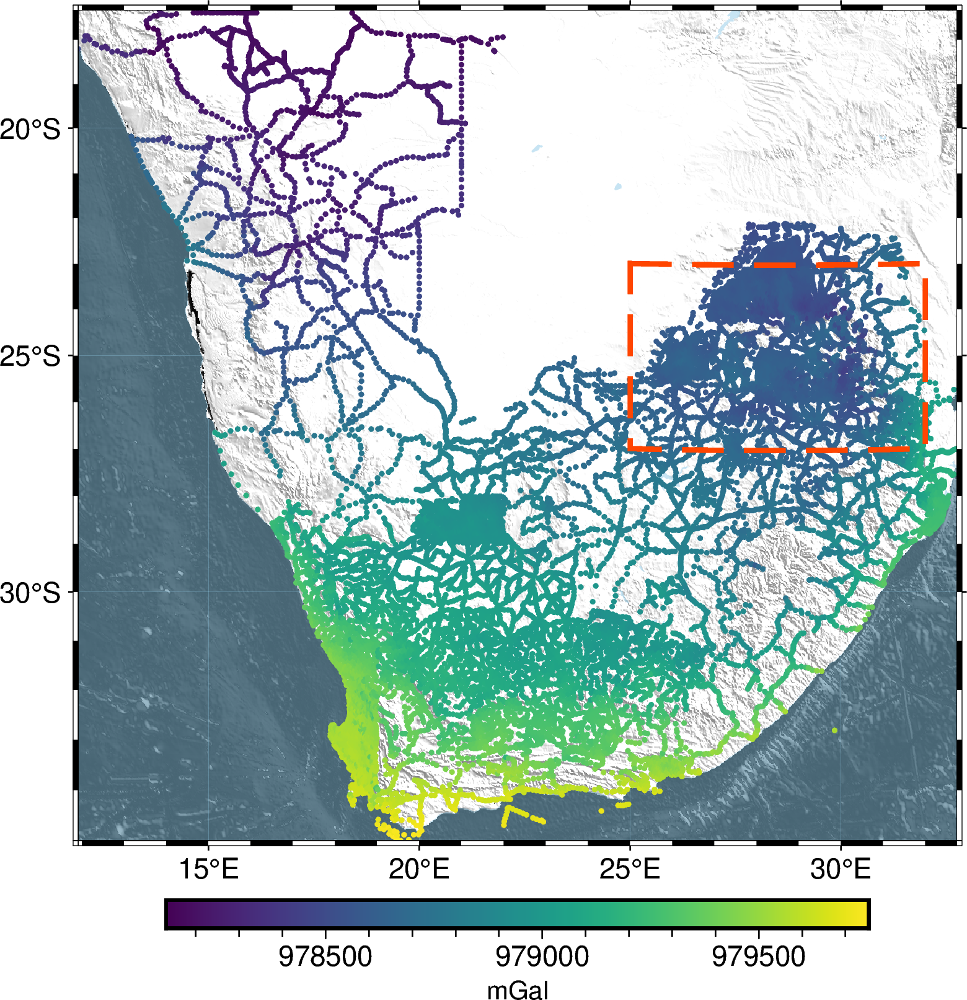

In [8]:
fig = pygmt.Figure()
gmt_projection = "M12c"

raw_region = vd.get_region((raw_data.longitude, raw_data.latitude))

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_01m",
    region=raw_region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
fig.coast(
    water="#8fcae7",
    transparency=50,
)
pygmt.makecpt(
    cmap="viridis",
    series=[raw_data.gravity_mgal.min(), raw_data.gravity_mgal.max()],
)
fig.plot(
    x=raw_data.longitude,
    y=raw_data.latitude,
    fill=raw_data.gravity_mgal,
    cmap=True,
    style="c2p",
    projection=gmt_projection,
    frame="af",
)
fig.plot(
    x=[region[0], region[1], region[1], region[0], region[0]],
    y=[region[3], region[3], region[2], region[2], region[3]],
    pen="2p,orangered1,-",
)
fig.colorbar(frame='af+l"mGal"')

fig.savefig(figsdir / "southern-africa-raw-gravity.png", dpi=300)
fig.show()

## Crop data

In [9]:
region_pad = vd.pad_region(region, pad=5)
data = raw_data[vd.inside((raw_data.longitude, raw_data.latitude), region)]
geoid = geoid.sel(longitude=slice(*region_pad[:2]), latitude=slice(*region_pad[2:]))
topography = topography.sel(
    longitude=slice(*region_pad[:2]), latitude=slice(*region_pad[2:])
)

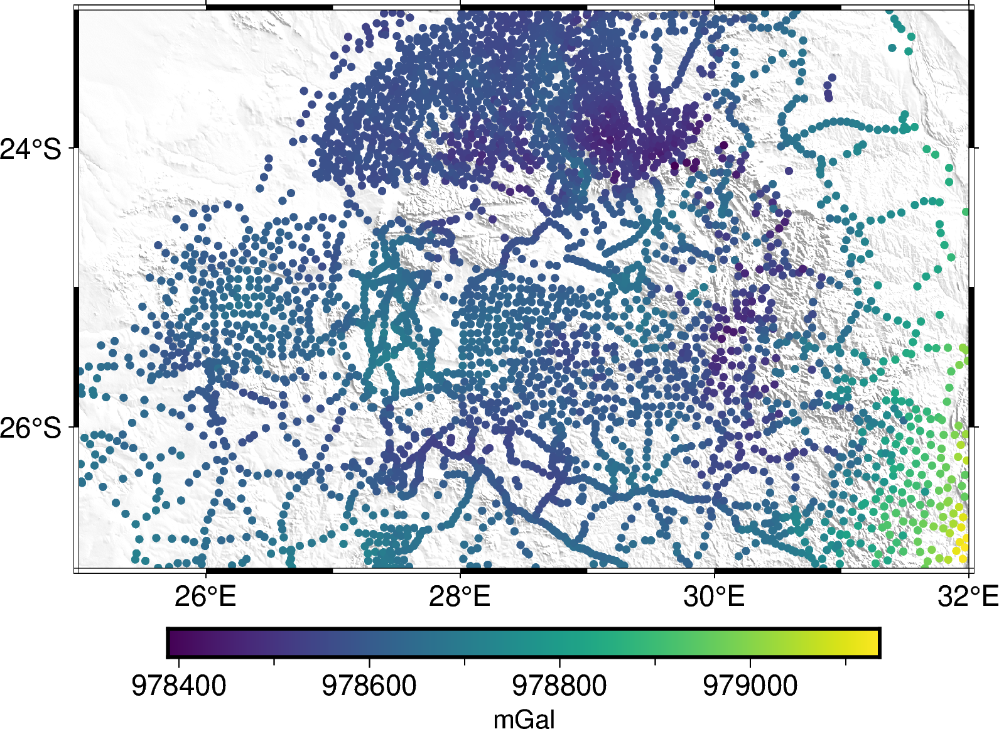

In [10]:
fig = pygmt.Figure()
gmt_projection = "M12c"

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
pygmt.makecpt(
    cmap="viridis",
    series=[data.gravity_mgal.min(), data.gravity_mgal.max()],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.gravity_mgal,
    cmap=True,
    style="c3p",
    projection=gmt_projection,
    frame="af",
)
fig.colorbar(frame='af+l"mGal"')

fig.savefig(figsdir / "bushveld-raw-gravity.png", dpi=300)
fig.show()

## Project data

In [11]:
projection = pyproj.Proj(proj="merc", lat_ts=data.latitude.mean())
easting, northing = projection(data.longitude.values, data.latitude.values)
data = data.assign(easting_m=easting, northing_m=northing)
topography_proj = vd.project_grid(topography, projection, method="nearest")
geoid_proj = vd.project_grid(geoid, projection, method="nearest")

## Compute topography referenced on the ellipsoid

In [12]:
topography_geometric = topography_proj + geoid_proj

Unravel the grid so that we can pass it to the interpolator

In [13]:
geoid_table = vd.grid_to_table(geoid_proj)
interpolator = vd.ScipyGridder(method="cubic")
interpolator.fit((geoid_table.easting, geoid_table.northing), geoid_table.geoid)

ScipyGridder()

Predict the geoid height at same locations as the observation points

In [14]:
data = data.assign(geoid_m=interpolator.predict((data.easting_m, data.northing_m)))
data = data.assign(height_geometric_m=data.height_sea_level_m + data.geoid_m)

## Gravity disturbance

In [15]:
data = data.assign(
    normal_gravity_mgal=bl.WGS84.normal_gravity(data.latitude, data.height_geometric_m)
)
data = data.assign(
    gravity_disturbance_mgal=data.gravity_mgal - data.normal_gravity_mgal
)

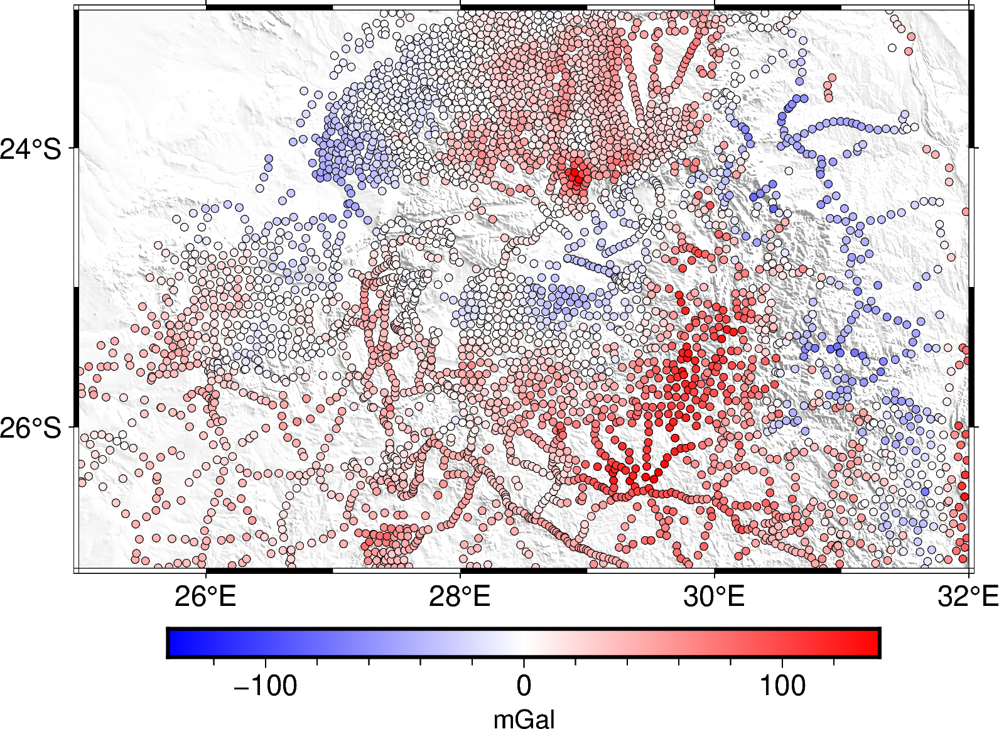

In [16]:
fig = pygmt.Figure()
gmt_projection = "M12c"

maxabs = vd.maxabs(data.gravity_disturbance_mgal)

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
pygmt.makecpt(
    cmap="polar",
    series=[-maxabs, maxabs],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.gravity_disturbance_mgal,
    cmap=True,
    style="c3p",
    pen="0.1p",
    projection=gmt_projection,
    frame="af",
)
fig.colorbar(frame='af+l"mGal"')

fig.savefig(figsdir / "bushveld-gravity-disturbance.png", dpi=300)
fig.show()

## Topographic correction

In [17]:
topography_density = np.where(topography_geometric > 0, 2670, -2670)
topography_density = np.where(topography_proj < 0, 1040 - 2670, topography_density)
topography_model = hm.prism_layer(
    coordinates=(topography_geometric.easting, topography_geometric.northing),
    surface=topography_geometric,
    reference=0,
    properties={"density": topography_density},
)

In [18]:
topography

<xarray.DataArray 'topography' (latitude: 85, longitude: 103)>
array([[ 1013.,  1236.,  1335., ..., -3867., -4446., -4842.],
       [ 1206.,  1270.,  1227., ..., -3790., -4350., -4736.],
       [ 1245.,  1197.,  1104., ..., -3847., -4362., -4703.],
       ...,
       [ 1128.,  1123.,  1113., ...,    -7.,   -32.,   -18.],
       [ 1115.,  1107.,  1098., ...,    17.,   -10.,   -21.],
       [ 1102.,  1094.,  1084., ...,    18.,     9.,   -13.]],
      dtype=float32)
Coordinates:
  * longitude  (longitude) float64 20.0 20.17 20.33 20.5 ... 36.67 36.83 37.0
  * latitude   (latitude) float64 -32.0 -31.83 -31.67 ... -18.33 -18.17 -18.0
Attributes:
    Conventions:     CF-1.8
    title:           Topographic and bathymetric height of ETOPO1 (ice surfac...
    crs:             WGS84
    source:          Generated from a spherical harmonic model by the ICGEM C...
    license:         public domain
    references:      https://doi.org/10.7289/V5C8276M
    long_name:       topographic height above mean sea level
    standard_name:   height_above_mean_sea_level
    description:     height topography/bathymetry referenced to mean sea level
    units:           m
    actual_range:    [-10023.   6082.]
    icgem_metadata:  generating_institute: gfz-potsdam\ngenerating_date: 2021...

In [19]:
pv_grid = topography_model.prism_layer.to_pyvista()
pv_grid["elevation"] = topography.values.ravel()
pv_grid

UnstructuredGrid (0x7f2f7ff08e80)
  N Cells:    8755
  N Points:   70040
  X Bounds:   2.011e+06, 3.745e+06
  Y Bounds:   -3.403e+06, -1.827e+06
  Z Bounds:   -4.822e+03, 3.006e+03
  N Arrays:   2

In [20]:
points = pv.PolyData(np.vstack((data.easting_m, data.northing_m, data.height_geometric_m)).T)
points["gravity disturbance [mGal]"] = data.gravity_disturbance_mgal
points

PolyData (0x7f2f7feb7be0)
  N Cells:    3877
  N Points:   3877
  N Strips:   0
  X Bounds:   2.525e+06, 3.231e+06
  Y Bounds:   -2.816e+06, -2.372e+06
  Z Bounds:   1.165e+02, 2.168e+03
  N Arrays:   1

/opt/mambaforge/envs/kegs2023/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


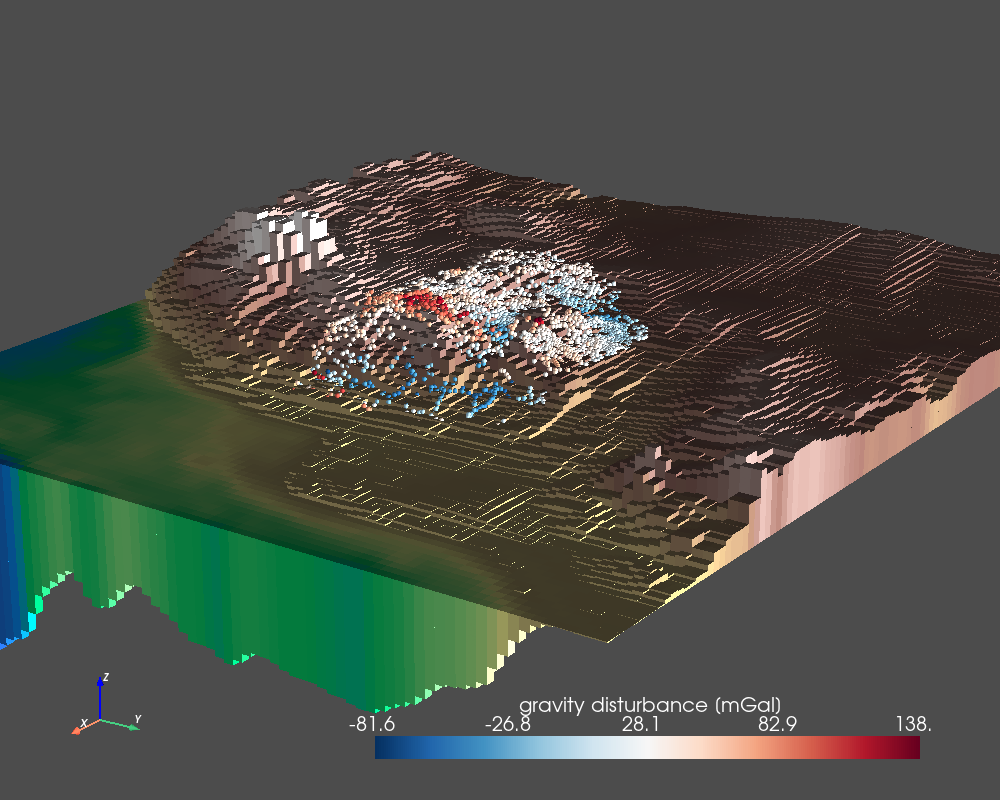

In [21]:
plotter = pv.Plotter(lighting="three_lights", window_size=(1000, 800), notebook=True)
plotter.add_mesh(pv_grid, scalars="elevation", cmap="terrain", show_scalar_bar=False)
plotter.set_scale(zscale=75)  # exaggerate the vertical coordinate

plotter.add_points(
    points,
    cmap="RdBu_r",
    render_points_as_spheres=True,
    point_size=5,
)

plotter.camera_position = "xz"
plotter.camera.elevation = 20
plotter.camera.azimuth = 125
plotter.camera.zoom(1.7)

# Add a ceiling light
west, east, south, north = vd.get_region((topography_model.easting, topography_model.northing))
easting_center, northing_center = (east + west) / 2, (north + south) / 2
light = pv.Light(
    position=(easting_center, northing_center, 10e3),
    focal_point=(easting_center, northing_center, 0),
    intensity=0.3,
    light_type="scene light",  # the light doesn't move with the camera
    positional=False,  # the light comes from infinity
)
plotter.add_light(light)

plotter.show_axes()
plotter.screenshot(figsdir / "topography-model.png", transparent_background=False)
plotter.show()

In [22]:
coordinates = (data.easting_m, data.northing_m, data.height_geometric_m)
data = data.assign(
    terrain_effect_mgal=topography_model.prism_layer.gravity(coordinates, field="g_z"),
)
data = data.assign(
    gravity_bouguer_mgal=data.gravity_disturbance_mgal - data.terrain_effect_mgal
)

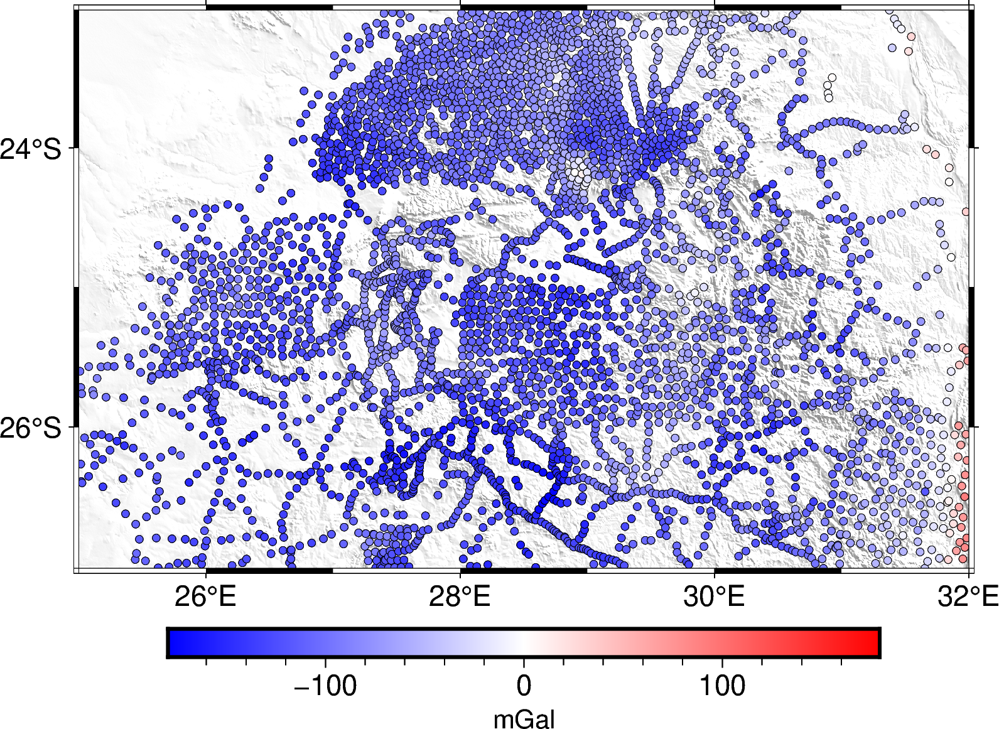

In [23]:
fig = pygmt.Figure()
gmt_projection = "M12c"

maxabs = vd.maxabs(data.gravity_bouguer_mgal)

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
pygmt.makecpt(
    cmap="polar",
    series=[-maxabs, maxabs],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.gravity_bouguer_mgal,
    cmap=True,
    style="c3p",
    pen="0.1p",
    projection=gmt_projection,
    frame="af",
)
fig.colorbar(frame='af+l"mGal"')

fig.savefig(figsdir / "bushveld-bouguer.png", dpi=300)
fig.show()

## Residual-regional separation

In [24]:
# Create a set of deep sources at a depth of 500 km
deep_sources = hm.EquivalentSources(damping=1000, depth=500e3)
# Fit the sources to the data
deep_sources.fit(
    (data.easting_m, data.northing_m, data.height_geometric_m),
    data.gravity_bouguer_mgal,
)

EquivalentSources(damping=1000, depth=500000.0)

In [25]:
# Use the sources to predict the regional field
data = data.assign(
    gravity_regional_mgal=deep_sources.predict(
        (data.easting_m, data.northing_m, data.height_geometric_m)
    )
)
# Calculate a residual field (which is what we want)
data = data.assign(
    gravity_residual_mgal=data.gravity_bouguer_mgal - data.gravity_regional_mgal
)

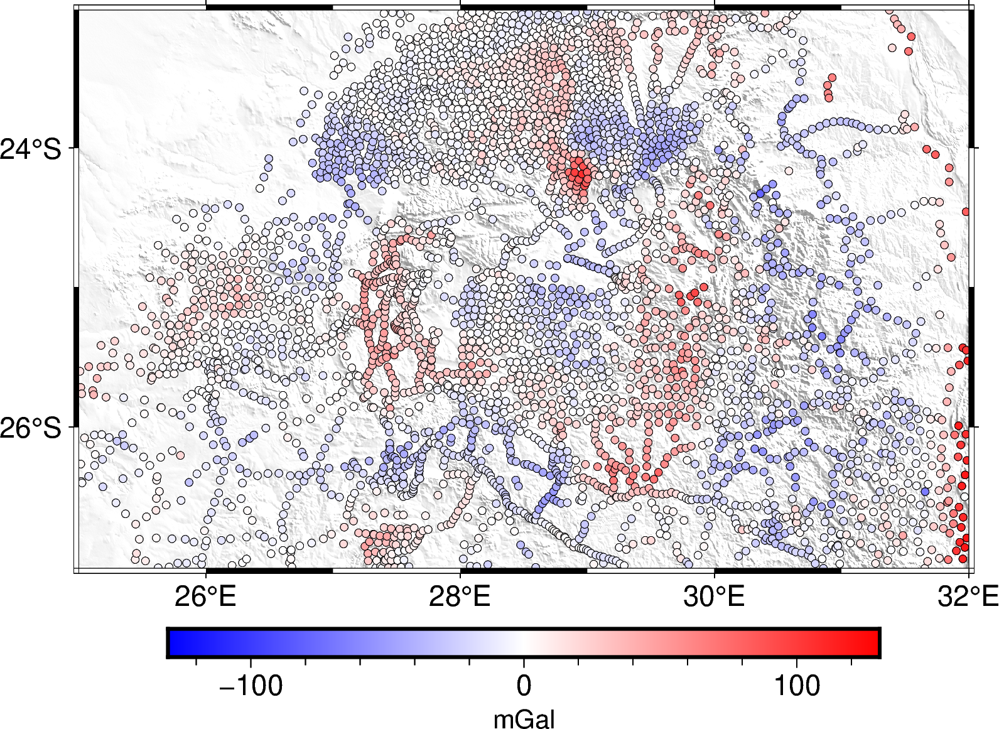

In [26]:
fig = pygmt.Figure()
gmt_projection = "M12c"

maxabs = vd.maxabs(data.gravity_residual_mgal)

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
pygmt.makecpt(
    cmap="polar",
    series=[-maxabs, maxabs],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.gravity_residual_mgal,
    cmap=True,
    style="c3p",
    pen="0.1p",
    projection=gmt_projection,
    frame="af",
)
fig.colorbar(frame='af+l"mGal"')

fig.savefig(figsdir / "bushveld-residual.png", dpi=300)
fig.show()

## Grid the residual

In [27]:
eqs = hm.EquivalentSources(damping=10, depth=10e3)
eqs.fit(
    (data.easting_m, data.northing_m, data.height_geometric_m),
    data.gravity_residual_mgal,
)
grid_coords = vd.grid_coordinates(
    region=region,
    spacing=2 / 60,  # Decimal degrees
    extra_coords=2200,  # height in meters
)
residual_grid = eqs.grid(
    coordinates=grid_coords,
    data_names=["gravity_residual"],
    dims=("latitude", "longitude"),
    projection=projection,
)

In [28]:
residual_grid = vd.convexhull_mask((data.longitude, data.latitude), grid=residual_grid)
residual_grid

<xarray.Dataset>
Dimensions:           (latitude: 121, longitude: 211)
Coordinates:
  * longitude         (longitude) float64 25.0 25.03 25.07 ... 31.93 31.97 32.0
  * latitude          (latitude) float64 -27.0 -26.97 -26.93 ... -23.03 -23.0
    upward            (latitude, longitude) float64 2.2e+03 2.2e+03 ... 2.2e+03
Data variables:
    gravity_residual  (latitude, longitude) float64 nan nan nan ... nan nan nan
Attributes:
    metadata:  Generated by EquivalentSources(damping=10, depth=10000.0)

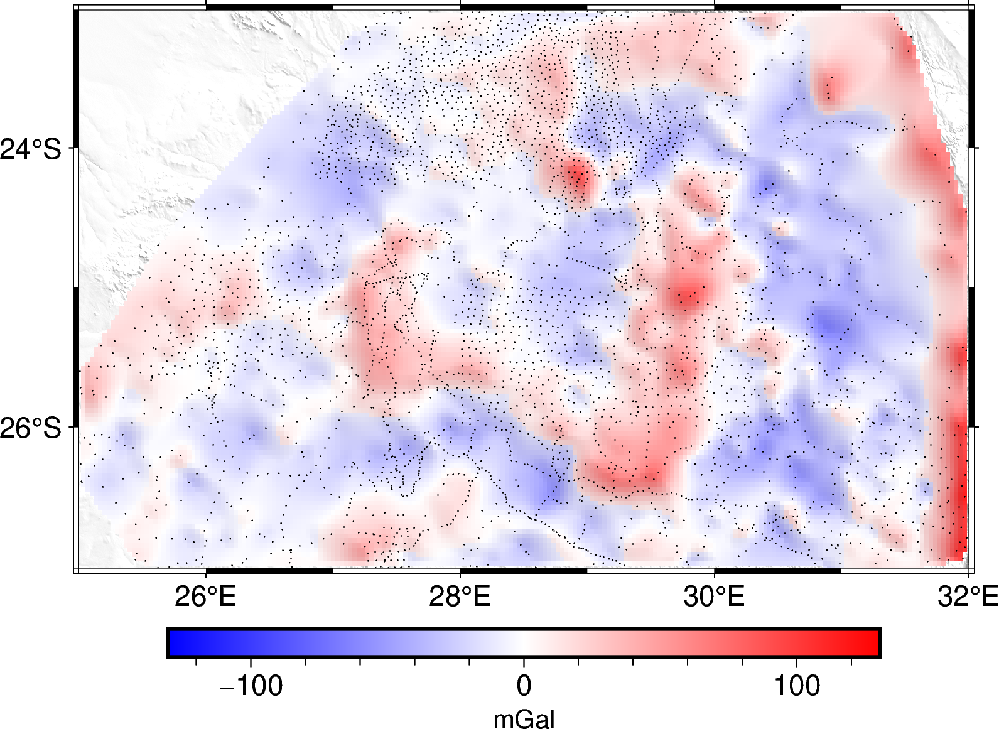

In [30]:
fig = pygmt.Figure()
gmt_projection = "M12c"

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)

pygmt.makecpt(cmap="polar", series=[-maxabs, maxabs], no_bg=True)
fig.grdimage(
    residual_grid.gravity_residual,
    shading="+a45+nt0.15",
    projection=gmt_projection,
    nan_transparent=True,
)

fig.plot(
    x=data.longitude,
    y=data.latitude,
    style="c0.5p",
    color="black",
    frame="af",
)
fig.colorbar(frame='af+l"mGal"')
fig.savefig(figsdir / "bushveld-residual-grid.png", dpi=300)
fig.show()